In [4]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
pip install -U object-detection-fastai

     |████████████████████████████████| 317kB 13.8MB/s 
     |████████████████████████████████| 51.0MB 59kB/s 
  Created wheel for openslide-python: filename=openslide_python-1.1.2-cp37-cp37m-linux_x86_64.whl size=27670 sha256=2a9bf263cfed201e2aa6665670f98dac396f56c84ac2cb396ff67ec90e77746e
  Stored in directory: /root/.cache/pip/wheels/6b/55/74/ba9d3dcc2c5c0f1282e08bae70df0ed57b496fb6b5c8f1adc9
Successfully built openslide-python
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30


In [7]:
from fastai import *
from fastai.vision import *
from fastai.callbacks import *

In [8]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric

In [27]:
coco = ['http://3.bp.blogspot.com/-S1scRCkI3vY/UHzV2kucsPI/AAAAAAAAA-k/YQ5UzHEm9Ss/s1600/Grizzly%2BBear%2BWildlife.jpg']
dest = 'images/grizzly.jpg'


In [168]:
coco = untar_data("https://github.com/wargreymon89/ObjectDetection/raw/master/data/cars", force_download=True)
images, lbl_bbox = get_annotations(coco/'annotations/train_sample.json')
img2bbox = dict(zip(images, lbl_bbox))
get_y_func = lambda o:img2bbox[o.name]

A new version of the dataset is available.


In [34]:
coco

PosixPath('/root/.fastai/data/cars')

In [142]:
size = 1024

In [169]:
data = (ObjectItemList.from_folder(coco)
        #Where are the images? -> in coco
        .split_by_rand_pct()
        #How to split in train/valid? -> randomly with the default 20% in valid
        .label_from_func(get_y_func)
        #How to find the labels? -> use get_y_func
        .transform(tfm_y=False ,size=size)
        #Data augmentation? -> Standard transforms with tfm_y=True
        .databunch(bs=2, collate_fn=bb_pad_collate))
        #Finally we convert to a DataBunch and we use bb_pad_collate
#data = data.normalize()

In [133]:
data

ImageDataBunch;

Train: LabelList (7 items)
x: ObjectItemList
Image (3, 2048, 2048),Image (3, 2048, 2048),Image (3, 2048, 2048),Image (3, 2048, 2048),Image (3, 2048, 2048)
y: ObjectCategoryList
ImageBBox (3024, 4032),ImageBBox (3024, 4032),ImageBBox (3024, 4032),ImageBBox (3024, 4032),ImageBBox (3024, 4032)
Path: /root/.fastai/data/cars;

Valid: LabelList (1 items)
x: ObjectItemList
Image (3, 2048, 2048)
y: ObjectCategoryList
ImageBBox (3024, 4032)
Path: /root/.fastai/data/cars;

Test: None

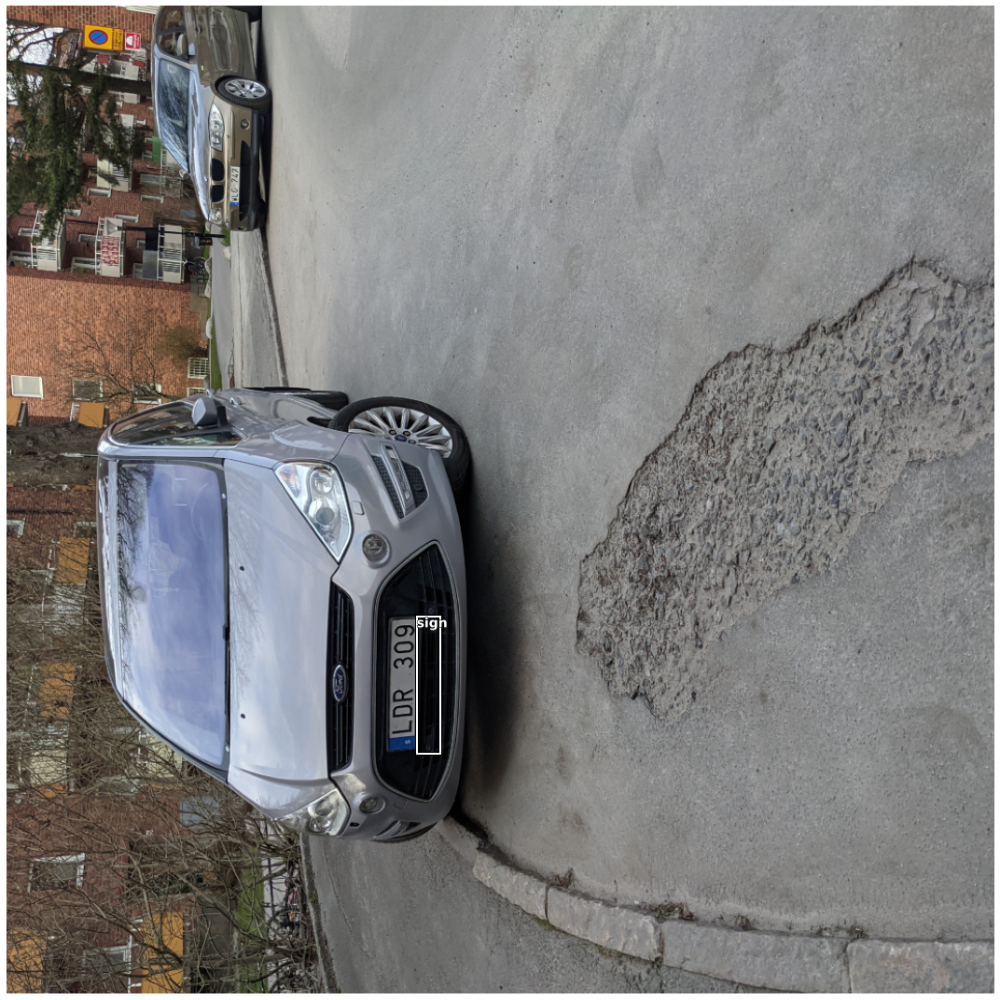

In [170]:
data.show_batch(rows=1, ds_type=DatasetType.Valid, figsize=(15,15))

In [103]:
data.classes

['background', 'sign']

In [48]:
[1,2**(1/3), 2**(2/3)]

[1, 1.2599210498948732, 1.5874010519681994]

In [156]:
anchors = create_anchors(sizes=[(32,32),(16,16),(8,8),(4,4)], ratios=[0.5, 1, 2], scales=[0.35, 0.5, 0.6, 1, 1.25, 1.6])

In [157]:
len(anchors)

24480

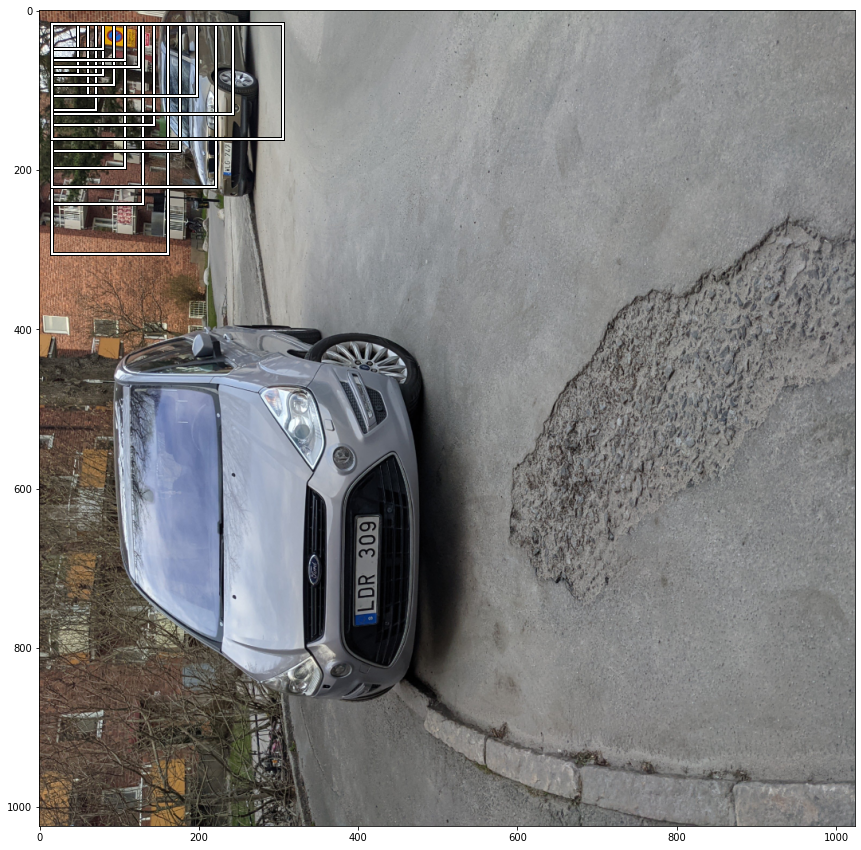

In [171]:
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:18]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

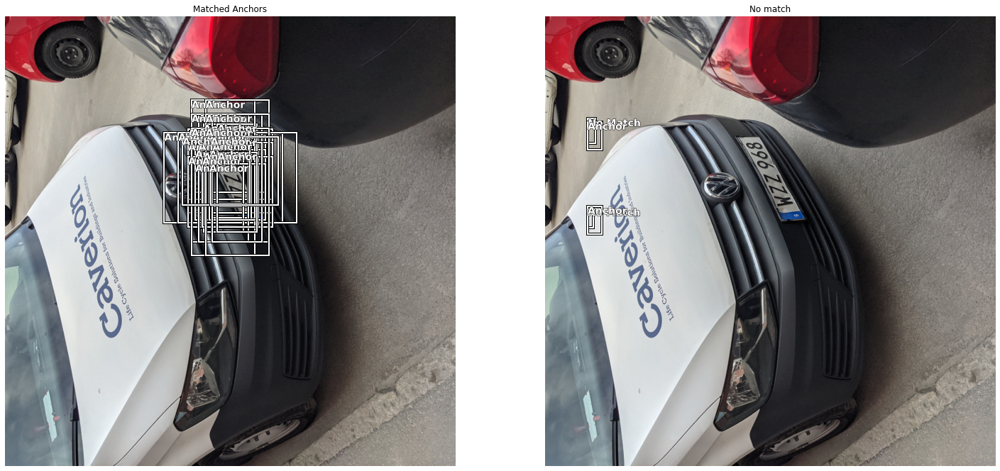

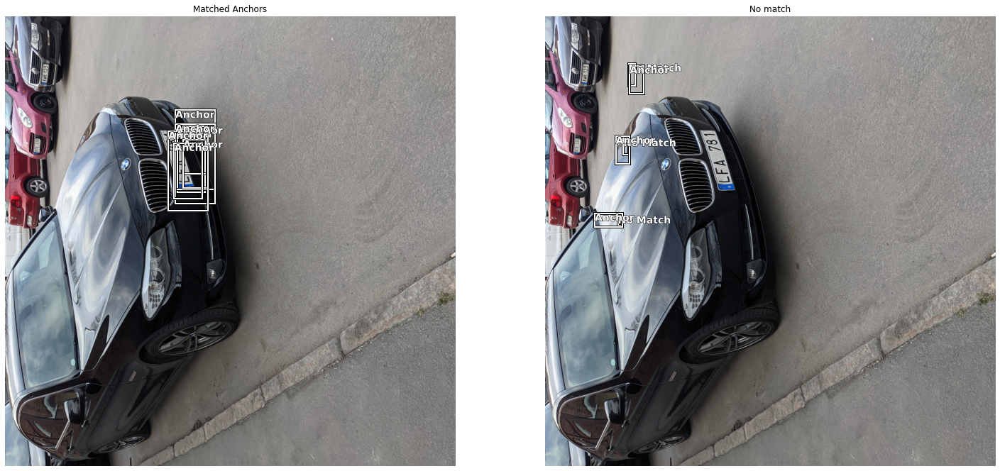

In [172]:
all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(25,25))

In [173]:
data.train_ds.c

2

In [174]:
n_classes = data.train_ds.c

crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=18, sizes=[32,16,8,4], chs=32, final_bias=-4., n_conv=2)
#model.eval()

In [175]:
voc = PascalVOCMetric(anchors, size, [i for i in data.train_ds.y.classes[1:]])
learn = Learner(data, model, loss_func=crit, callback_fns=[ShowGraph, BBMetrics],
                metrics=[voc])

In [176]:
learn.split([model.encoder[2], model.c5top5])
learn.freeze_to(-2)

In [ ]:
self.

In [177]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-sign,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


IndexError: ignored

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-book,AP-chair,AP-couch,AP-remote,AP-tv,AP-vase,time
0,2.169994,2.259702,0.040143,0.489697,1.770005,0.000398,0.074876,0.064081,0.007283,0.000000,0.094220,03:11
1,1.731074,1.664063,0.170631,0.407226,1.256837,0.011655,0.120779,0.199507,0.017647,0.455240,0.218955,03:07
2,1.474875,1.509062,0.187860,0.377112,1.131950,0.024721,0.141198,0.193470,0.066777,0.479486,0.221509,03:12


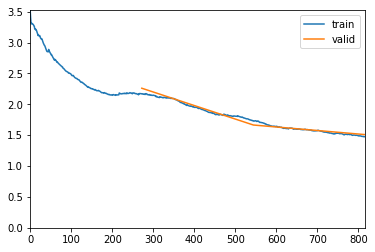

In [ ]:
learn.fit_one_cycle(3, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-book,AP-chair,AP-couch,AP-remote,AP-tv,AP-vase,time
0,1.472294,1.599764,0.158803,0.385957,1.213806,0.018869,0.120624,0.137644,0.054375,0.423454,0.197855,03:19
1,1.644351,1.791672,0.138816,0.410458,1.381213,0.004751,0.089786,0.221918,0.012900,0.358800,0.144743,03:12
2,1.772430,1.777559,0.132887,0.408994,1.368565,0.005919,0.075095,0.210875,0.015514,0.359706,0.130215,03:14
3,1.681056,1.654816,0.150120,0.383538,1.271278,0.021749,0.098596,0.147342,0.030786,0.432880,0.169365,03:17
4,1.607463,1.615077,0.164021,0.373200,1.241877,0.022803,0.113339,0.205990,0.050168,0.405375,0.186449,03:19
5,1.502257,1.708495,0.136862,0.361128,1.347366,0.022455,0.090177,0.091102,0.033443,0.432744,0.151252,03:20
6,1.381117,1.428304,0.204288,0.347032,1.081272,0.037503,0.139920,0.214914,0.094011,0.496799,0.242582,03:21
7,1.263347,1.340594,0.228309,0.335232,1.005362,0.045497,0.169478,0.242629,0.108008,0.541667,0.262574,03:18
8,1.196914,1.352324,0.209727,0.330933,1.021391,0.042437,0.142795,0.194005,0.119137,0.507555,0.252432,03:21
9,1.162093,1.333483,0.213452,0.329912,1.003570,0.046650,0.150127,0.194048,0.119000,0.510730,0.260159,03:21


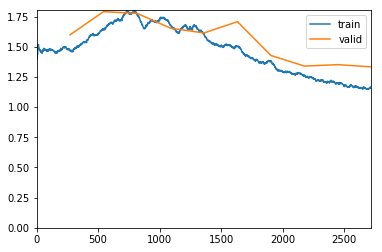

In [ ]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

In [ ]:
data.train_ds.classes

['background', 'book', 'chair', 'couch', 'remote', 'tv', 'vase']

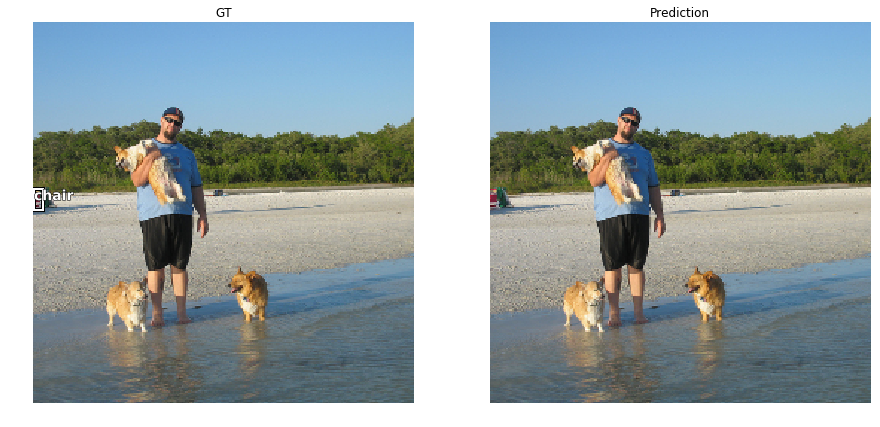

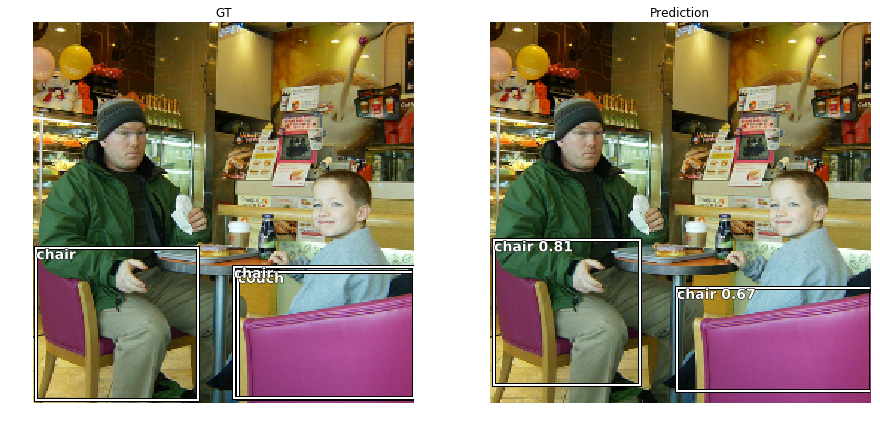

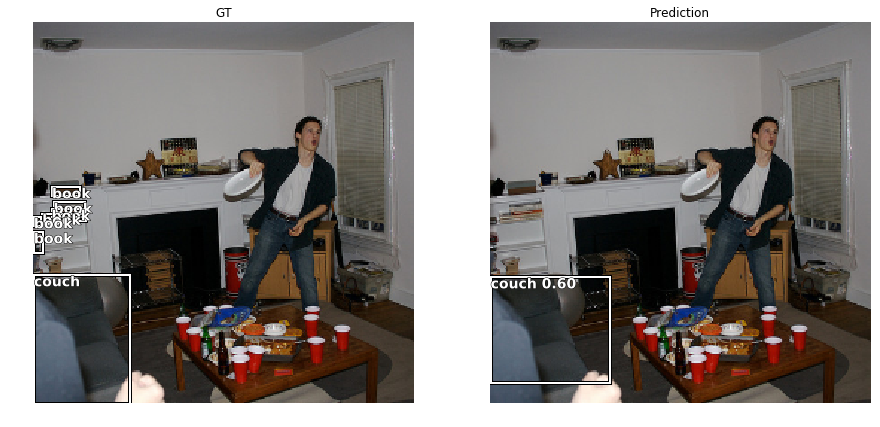

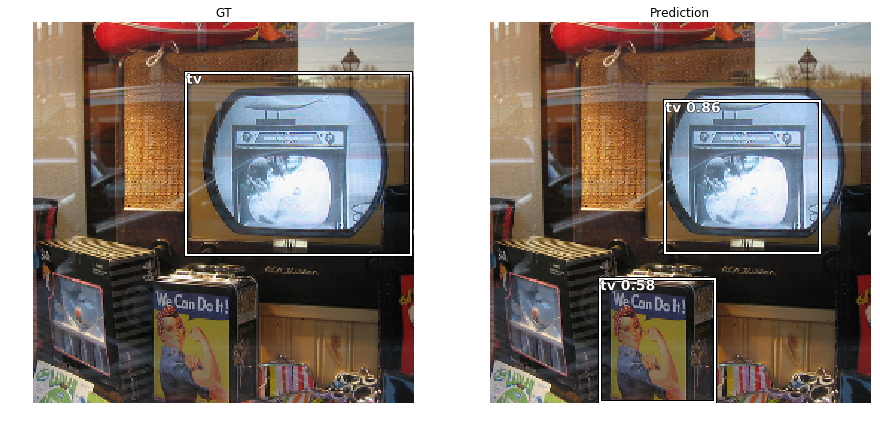

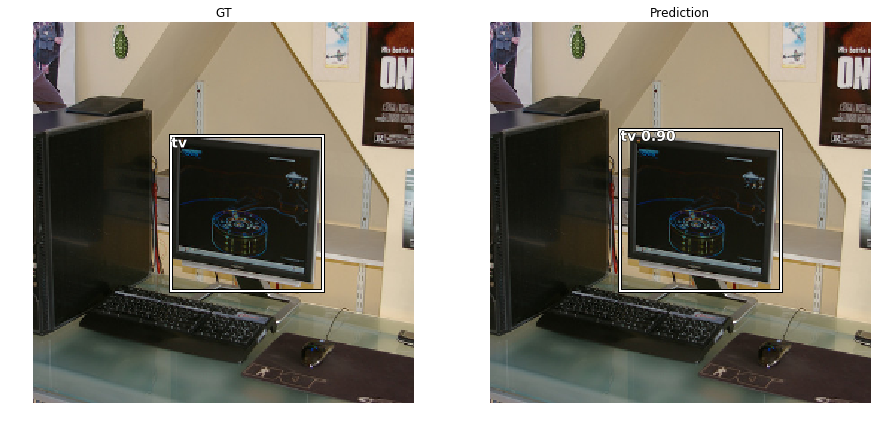

...

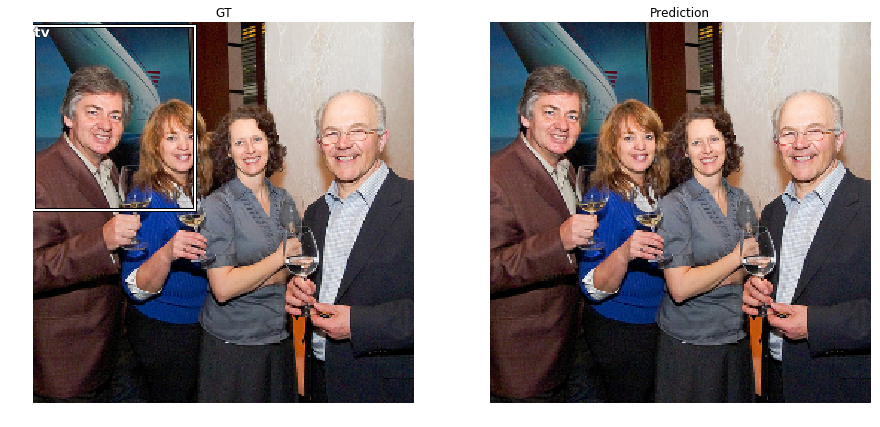

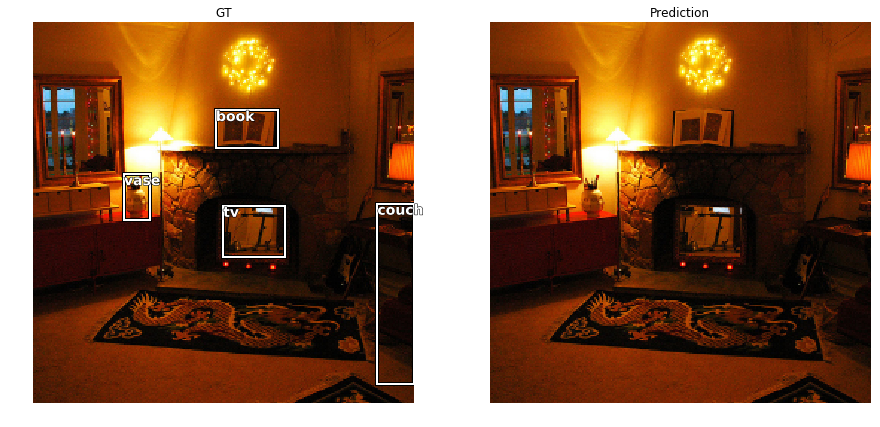

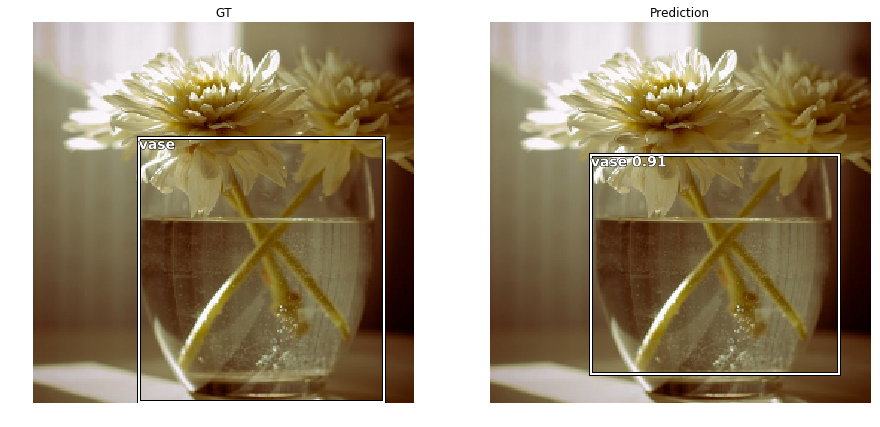

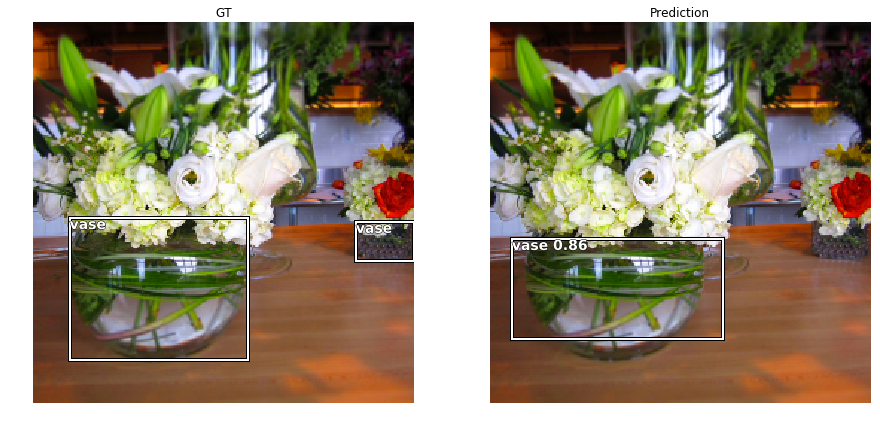

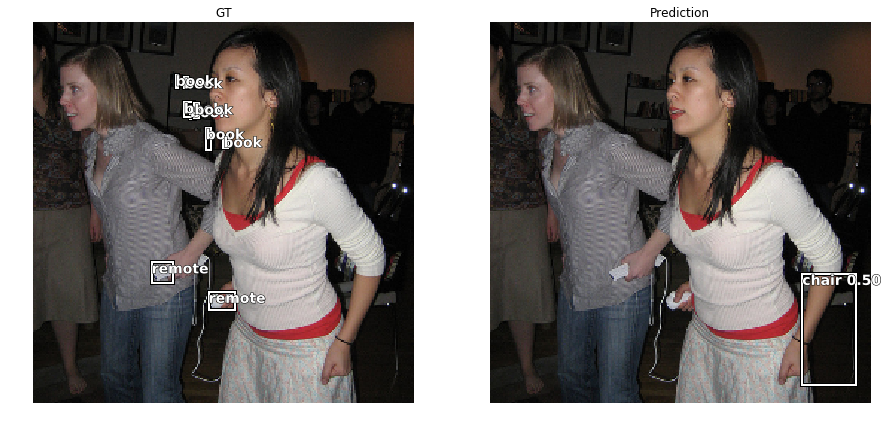

In [ ]:
show_results_side_by_side(learn, anchors, detect_thresh=0.5, nms_thresh=0.1, image_count=25)